# Multimodal Fusion: Early Fusion

# Section 0: Import modules, set variables, load functions 

In [1]:
import os
import numpy as np
import pandas as pd
from keras import backend as K
from sklearn.metrics import confusion_matrix    
from sklearn import metrics
from keras.models import Model
from keras.layers import Dense, Reshape, concatenate, Lambda, Average, Maximum, Add, Multiply, Concatenate, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers.embeddings import Embedding
from keras.engine.input_layer import Input
from keras.optimizers import Adam
from utils import *
from keras.activations import relu
from sklearn.model_selection import StratifiedKFold
import random
import dill
import matplotlib.pyplot as plt
from scipy import ndimage
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from PIL import Image
import io
from keras.utils.training_utils import multi_gpu_model
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy import ndimage
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from PIL import Image
import io

Using TensorFlow backend.


In [2]:
from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())
G = len(K.tensorflow_backend._get_available_gpus())

['/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1']


In [3]:
SRC = 'PMC'

if SRC=='PMC':
    CLASSES = {0: 'bar', 1: 'gel', 2: 'map', 3: 'network', 4: 'plot',
             5: 'text', 6: 'box', 7: 'heatmap',8: 'medical', 9: 'nxmls', 10: 'screenshot',
             11: 'topology', 12: 'diagram', 13: 'histology', 14: 'microscopy',
             15: 'photo', 16: 'sequence', 17: 'tree', 18: 'fluorescence', 19: 'line',
             20: 'molecular', 21: 'pie', 22: 'table'}
    
    class_names = ['bar', 'gel', 'network', 'plot', 'histology', 'sequence',
                               'line', 'molecular']
else:
    class_names = ['cat','dog']
num_class = len(class_names)
NN_Class_Names = dict(enumerate(class_names))
test_size = 0.2
epochs = 150
#Set parameters
create_word_vec = False
w2v_epochs = 20
w2v_window_size=5
w2v_filters=''
seed = 0
max_text_len = 200
vocabulary_size = 10000
csv_fname = 'image_list.csv'
coco_loc = '/home/kevin/Documents/Lab/coco_dataset'
pmc_loc = '/gpfs/ysm/pi/krauthammer/kl533/'
filters = ''
use_glove = False
LOAD_IMG_MODEL_WEIGHTS = False
LOAD_TXT_MODEL_WEIGHTS = False
CHANNELS = 3#should be either 3 or 1 for the number of channels
shape = (100,100,CHANNELS)#image shape
embedding_output_dim = 100
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None)
nltk.download('punkt')
nltk.download('stopwords')
plt.rcParams["figure.dpi"] = 600
n_splits = 5

[nltk_data] Downloading package punkt to /ysm-
[nltk_data]     gpfs/home/kl533/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /ysm-
[nltk_data]     gpfs/home/kl533/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
def Generate_Model(image = True, text = True):
    #set up our text input
    if image and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=False, weights=[embedding_weights])
        embedded_text = embedding(input_text)
        text_embedding = Lambda(embedding_3Ch)(embedded_text)
        #set up our image input
        image_input = Input(shape, name='image_input')
        '''merge our data for early fusion. Essentially we are just concatenating our data together'''
        merged = concatenate([text_embedding, image_input], axis=1, name='merged')
        x = get_img_branch()(merged)
        x = Dense(1024, name='dense_layer1')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, name='dense_layer2')(x)
        x = Activation('relu')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='output')(x)
        classificationModel = Model(inputs=[input_text, image_input], outputs=[output])
    
    if image and not text:
        image_input = Input(shape, name='image_input')
        x = get_img_branch()(image_input)
        x = Dense(1024, name='dense_layer1')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, name='dense_layer2')(x)
        x = Activation('relu')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='image_output')(x)
        classificationModel = Model(inputs=[image_input], outputs=[output])
    if not image and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=False, weights=[embedding_weights])
        embedded_text = embedding(input_text)
        #text_embedding = Reshape((max_text_len,shape[0],1))(embedded_text)
        text_embedding = Lambda(embedding_3Ch)(embedded_text)
        x = get_img_branch()(text_embedding)
        x = Dense(1024, name='dense_layer1')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, name='dense_layer2')(x)
        x = Activation('relu')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='text_output')(x)
        classificationModel = Model(inputs=[input_text], outputs=[output])
    if G > 1:
        classificationModel = get_multi_gpu_model(classificationModel, G)
    return classificationModel

# Section 1: Initalize variables and load data

In [5]:
# Load our data from source

print('Getting Data')
if SRC == 'PMC':
    image_classes = [list(CLASSES.keys())[list(CLASSES.values()).index(x)] for 
                 x in class_names]  
    data = load_PMC(csv_fname, image_classes, uniform=True)
    #dynamically add location of files
    data['location'] = pmc_loc + data['location'].astype(str)
else:
    data = load_COCO(coco_loc, class_names=class_names)

Getting Data


## Optional: Create embeddings

In [6]:
#%%Section 0.5 create embeddings - Optional
if create_word_vec:
    print('Section 0.5: create embeddings')
    from w2v_keras import w2v_keras
    w2v = w2v_keras(vocabulary_size=vocabulary_size, window_size=w2v_window_size, filters=w2v_filters, vector_dim = embedding_output_dim)
    w2v.fit(data['caption'], epochs=w2v_epochs)
    w2v.save_embeddings('w2v_embeddings.json')

## Get data into format our model understands

In [7]:
#%% Section 1: Generate our sequences from text
print('Get model data')
(X_text_train, X_text_test, X_image_train, X_image_test, y_train, y_test, 
 tokenizer) = get_model_data(data, seed=seed, test_size = test_size, vocabulary_size = vocabulary_size, 
          filters = filters, max_text_len=max_text_len, shape=shape)

Get model data
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/ysm-gpfs/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


## Load our word embeddings

In [8]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

In [9]:
#save env so we can pull up the variables later
dill.dump_session('latest_early_fusion_env.db')

### Lets visualize our models:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


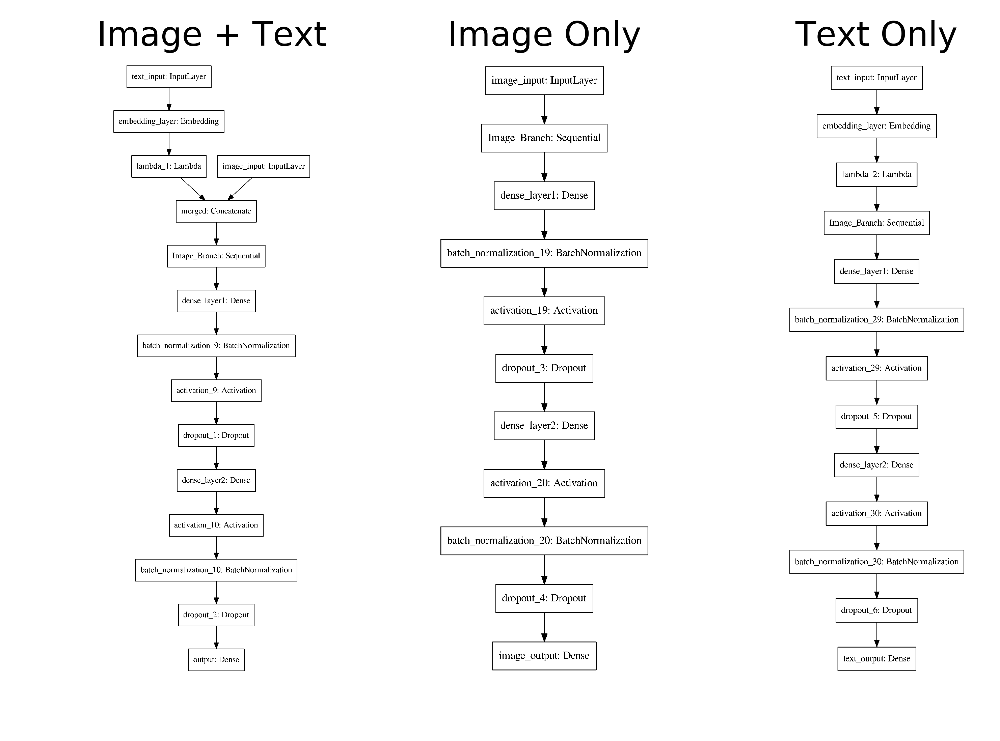

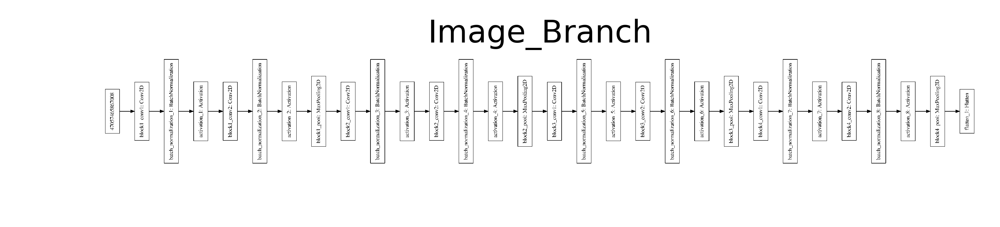

In [10]:
G_bak = G
G = 1
text_image_model_vis = Generate_Model(image = True, text=True)
image_model_vis = Generate_Model(image = True, text=False)
text_model_vis = Generate_Model(image = False, text=True)
G = G_bak

model_list = {'Image + Text': text_image_model_vis, 'Image Only': image_model_vis, 
              'Text Only': text_model_vis}
base_model_list = {'Image_Branch': text_image_model_vis.get_layer('Image_Branch')}
fig,ax = plt.subplots(1,len(model_list))

for i, (name,model) in enumerate(model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

fig,ax = plt.subplots(len(base_model_list),1)
for i, (name,model) in enumerate(base_model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    x_ = ndimage.rotate(x_, 90)
    ax.imshow(x_)
    ax.axis("off")
    ax.set_title(name)
    
del text_image_model_vis
del image_model_vis
del text_model_vis
del model_list
del base_model_list
del model
import gc
gc.collect()
from keras import backend as K
K.clear_session()

# Section 2: Train Test Split

# Train with only images

### Generate model and load callbacks

In [11]:
print('Train with only images')
image_model = Generate_Model(image=True, text=False)
image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="early_fusion_weights/weights-improvement_image_only.hdf5"
if LOAD_IMG_MODEL_WEIGHTS:
    print ('Loading image model weights')
    image_model.load_weights(filepath)
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train with only images
[INFO] training with 2 GPUs...


### Train model

In [12]:
history = image_model.fit([X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 9s 4ms/step - loss: 2.7007 - acc: 0.2293 - val_loss: 4.6066 - val_acc: 0.2540

Epoch 00001: val_acc improved from -inf to 0.25397, saving model to early_fusion_weights/weights-improvement_image_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.9889 - acc: 0.3606 - val_loss: 2.2051 - val_acc: 0.3690

Epoch 00002: val_acc improved from 0.25397 to 0.36905, saving model to early_fusion_weights/weights-improvement_image_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.6337 - acc: 0.4392 - val_loss: 2.0265 - val_acc: 0.3611

Epoch 00003: val_acc did not improve from 0.36905
Epoch 4/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.3411 - acc: 0.5325 - val_loss: 1.7692 - val_acc: 0.4008

Epoch 00004: val_acc improved from 0.36905 to 0.40079, saving model to early_fusion_weights/weights-improv

2263/2263 [==============================] - 2s 1ms/step - loss: 0.0170 - acc: 0.9947 - val_loss: 0.8198 - val_acc: 0.8056

Epoch 00037: val_acc improved from 0.80556 to 0.80556, saving model to early_fusion_weights/weights-improvement_image_only.hdf5
Epoch 38/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0138 - acc: 0.9965 - val_loss: 0.8081 - val_acc: 0.7976

Epoch 00038: val_acc did not improve from 0.80556
Epoch 39/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0130 - acc: 0.9973 - val_loss: 0.7939 - val_acc: 0.7976

Epoch 00039: val_acc did not improve from 0.80556
Epoch 40/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0131 - acc: 0.9965 - val_loss: 0.7855 - val_acc: 0.7937

Epoch 00040: val_acc did not improve from 0.80556
Epoch 41/150
2263/2263 [==============================] - 2s 1ms/step - loss: 0.0121 - acc: 0.9960 - val_loss: 0.7801 - val_acc: 0.8254

Epoch 00041: val_acc improved from 0.80556 to 0.82

### Plot training history

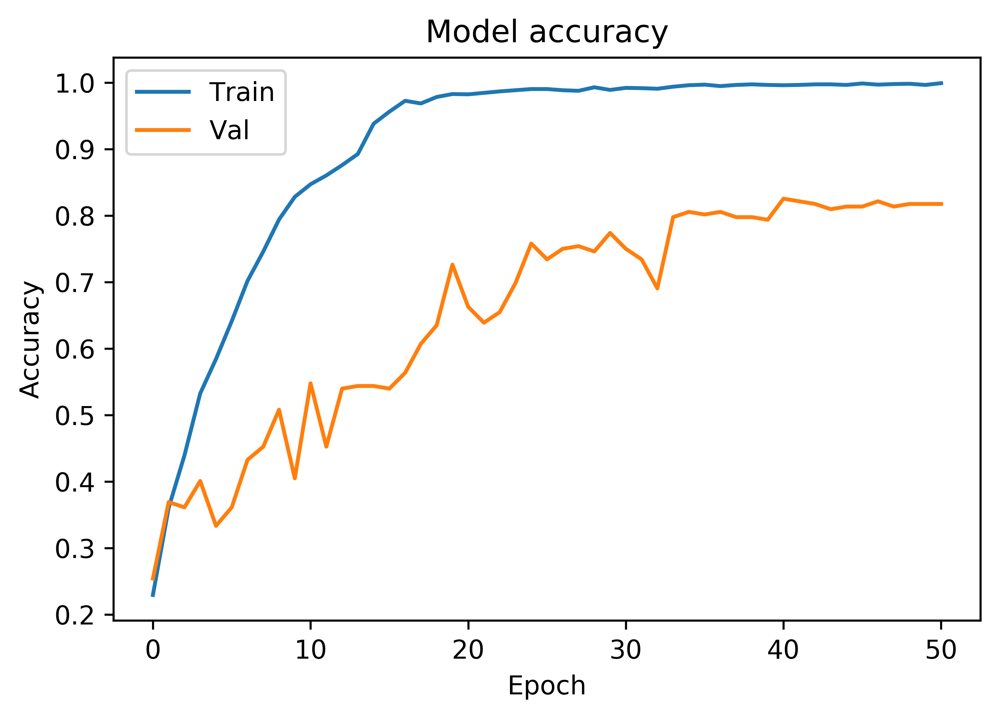

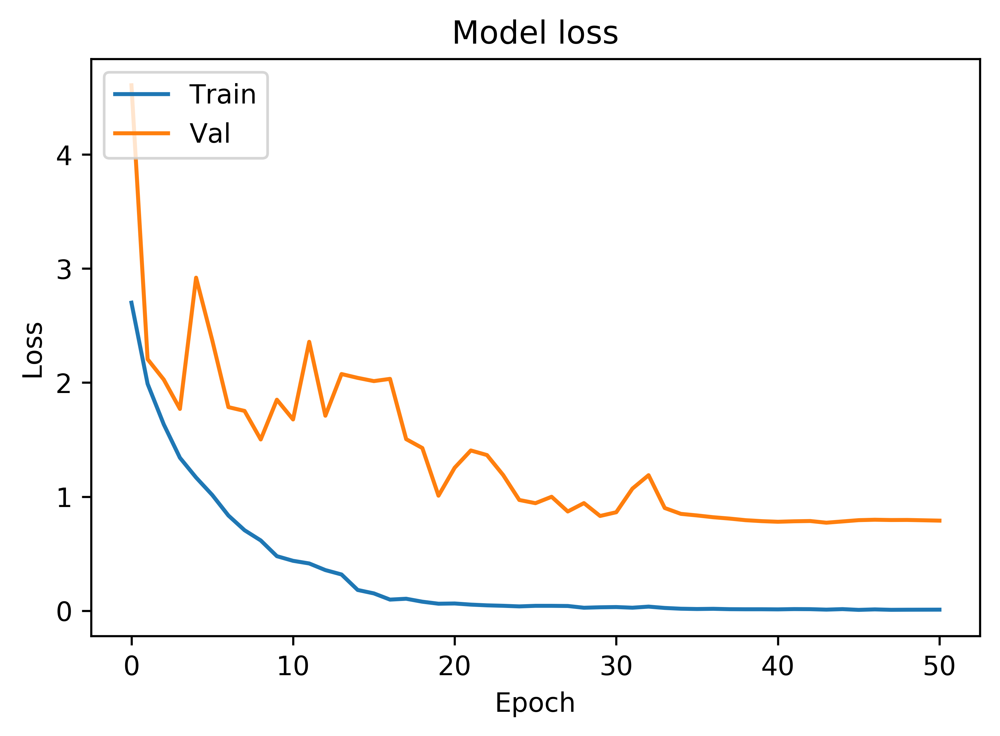

In [13]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [14]:
y_hat = test_model(image_model, zip(X_image_test, y_test), image = True, text = False, class_names=class_names)

629/629 [==============================] - 1s 887us/step
[0.7809576514415407, 0.8219395869297519]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         62    2        1     2          1         0     3          1
gel          1   81        7     1          1         0     1          0
network      0    1       52     1          0         6     3          2
plot         4    0        1    61          0         0    18          2
histology    0    3        0     0         71         0     0          2
sequence     0    1        6     2          0        62     2          1
line         0    1        6     8          0         4    65          2
molecular    0    0        6     1          6         0     2         63
              precision    recall  f1-score   support

         bar       0.93      0.86      0.89        72
         gel       0.91      0.88      0.90        92
     network       0.66      0.80      0.72        65
        plot       0.80     

# Train with only text

### Generate model and load callbacks

In [15]:
print('Train with only text')
text_model = Generate_Model(image=False, text=True)
text_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="early_fusion_weights/weights-improvement_text_only.hdf5"
if LOAD_TXT_MODEL_WEIGHTS:
    print ('Loading text model weights')
    text_model.load_weights(filepath)
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train with only text
[INFO] training with 2 GPUs...


### Train model

In [16]:
history = text_model.fit([X_text_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 11s 5ms/step - loss: 3.1478 - acc: 0.1525 - val_loss: 6.3858 - val_acc: 0.1508

Epoch 00001: val_acc improved from -inf to 0.15079, saving model to early_fusion_weights/weights-improvement_text_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 5s 2ms/step - loss: 2.7803 - acc: 0.1662 - val_loss: 5.3430 - val_acc: 0.2183

Epoch 00002: val_acc improved from 0.15079 to 0.21825, saving model to early_fusion_weights/weights-improvement_text_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 5s 2ms/step - loss: 2.5855 - acc: 0.1905 - val_loss: 4.4222 - val_acc: 0.1865

Epoch 00003: val_acc did not improve from 0.21825
Epoch 4/150
2263/2263 [==============================] - 5s 2ms/step - loss: 2.4450 - acc: 0.1975 - val_loss: 2.3445 - val_acc: 0.2381

Epoch 00004: val_acc improved from 0.21825 to 0.23810, saving model to early_fusion_weights/weights-improve

2263/2263 [==============================] - 4s 2ms/step - loss: 0.8619 - acc: 0.6810 - val_loss: 1.3546 - val_acc: 0.5000

Epoch 00039: val_acc did not improve from 0.57540
Epoch 40/150
2263/2263 [==============================] - 5s 2ms/step - loss: 0.8461 - acc: 0.6796 - val_loss: 1.2931 - val_acc: 0.5516

Epoch 00040: val_acc did not improve from 0.57540
Epoch 41/150
2263/2263 [==============================] - 5s 2ms/step - loss: 0.8285 - acc: 0.6876 - val_loss: 1.2791 - val_acc: 0.5714

Epoch 00041: val_acc did not improve from 0.57540
Epoch 42/150
2263/2263 [==============================] - 5s 2ms/step - loss: 0.8258 - acc: 0.6849 - val_loss: 1.2682 - val_acc: 0.5913

Epoch 00042: val_acc improved from 0.57540 to 0.59127, saving model to early_fusion_weights/weights-improvement_text_only.hdf5
Epoch 43/150
2263/2263 [==============================] - 5s 2ms/step - loss: 0.8437 - acc: 0.6880 - val_loss: 1.2969 - val_acc: 0.5397

Epoch 00043: val_acc did not improve from 0.59127
E

### Plot training history

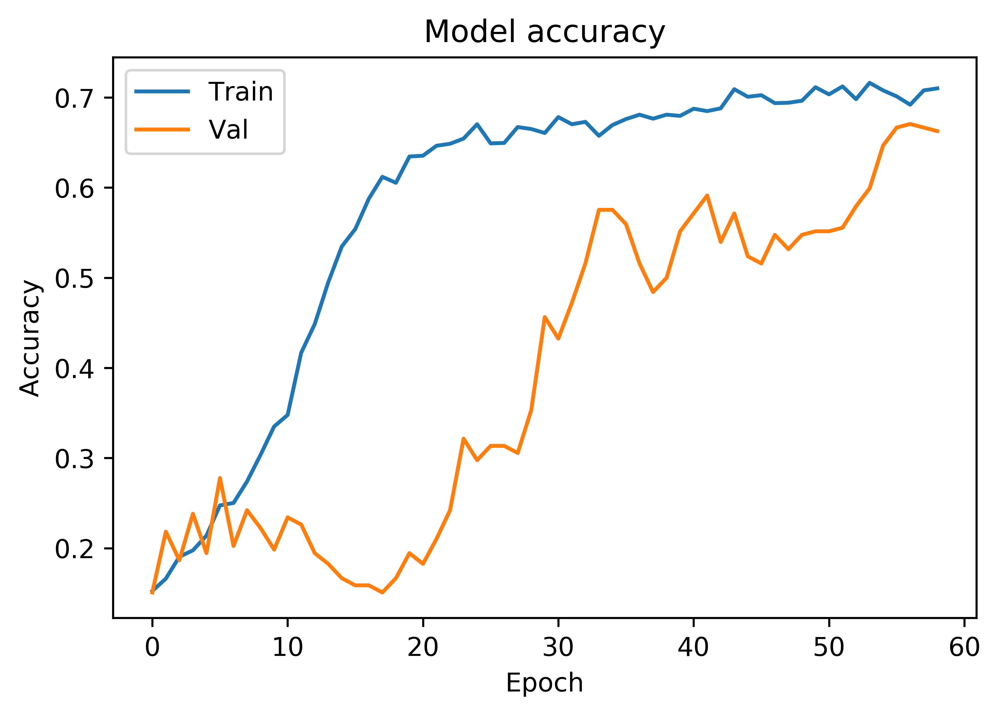

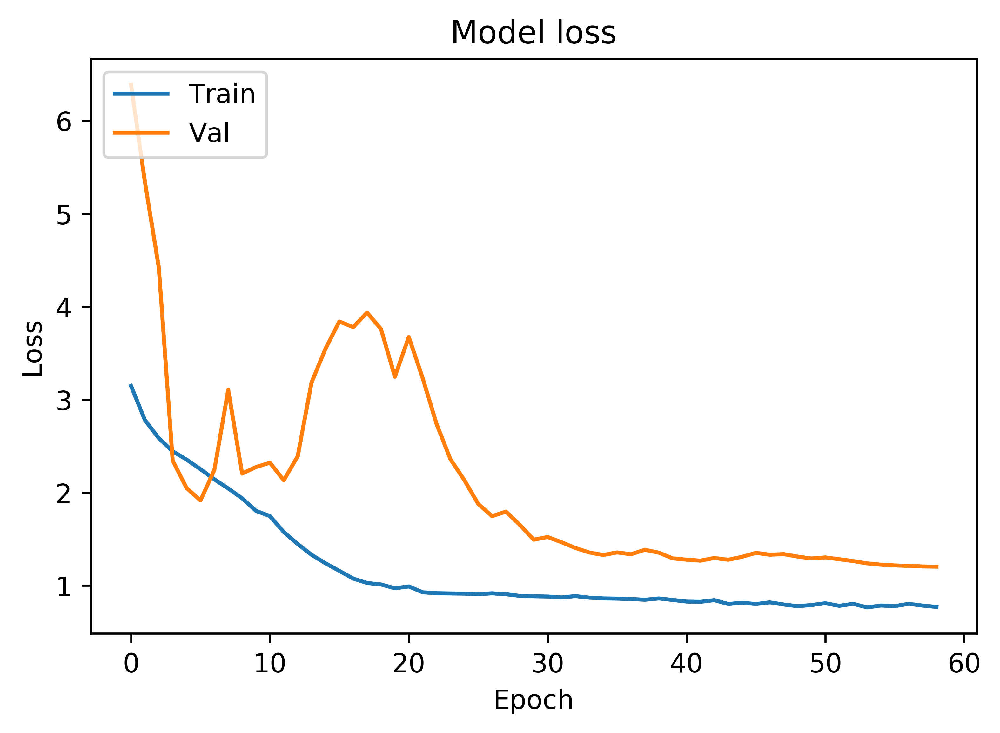

In [17]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [18]:
y_hat = test_model(text_model, zip(X_text_test, y_test), image = False, text = True, class_names=class_names)

629/629 [==============================] - 1s 2ms/step
[1.159539767024248, 0.6534181247644469]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         44    2        7     1          0         1    11          6
gel         10   56        1     3          0         2     8         12
network      1    0       49     0          0         0     4         11
plot        10    0        4    55          1         2    12          2
histology    4    0        6     1         43         2     3         17
sequence     3    2        7     2          0        55     4          1
line        12    0        5     1          0         0    64          4
molecular    4    0       23     1          2         2     1         45
              precision    recall  f1-score   support

         bar       0.50      0.61      0.55        72
         gel       0.93      0.61      0.74        92
     network       0.48      0.75      0.59        65
        plot       0.86      0.

# Model fusion: Train with images and text

In [19]:
text_image_model = Generate_Model(image = True, text=True)
#set optimizer:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0005, amsgrad=True) #RMSprop(lr=0.001, rho=0.9, epsilon=1e-07, decay=0.0)
text_image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
# checkpoint
filepath="early_fusion_weights/weights-improvement_image_text.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

[INFO] training with 2 GPUs...


### Train model

In [20]:
history = text_image_model.fit([X_text_train, X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 14s 6ms/step - loss: 2.4666 - acc: 0.2921 - val_loss: 9.9200 - val_acc: 0.1190

Epoch 00001: val_acc improved from -inf to 0.11905, saving model to early_fusion_weights/weights-improvement_image_text.hdf5
Epoch 2/150
2263/2263 [==============================] - 8s 3ms/step - loss: 1.7189 - acc: 0.4503 - val_loss: 4.5331 - val_acc: 0.2143

Epoch 00002: val_acc improved from 0.11905 to 0.21429, saving model to early_fusion_weights/weights-improvement_image_text.hdf5
Epoch 3/150
2263/2263 [==============================] - 8s 3ms/step - loss: 1.3953 - acc: 0.5214 - val_loss: 2.5465 - val_acc: 0.3730

Epoch 00003: val_acc improved from 0.21429 to 0.37302, saving model to early_fusion_weights/weights-improvement_image_text.hdf5
Epoch 4/150
2263/2263 [==============================] - 7s 3ms/step - loss: 1.2232 - acc: 0.5806 - val_loss: 1.9538 - val_acc: 0.4325

Epoch 00004: val_acc improv

2263/2263 [==============================] - 8s 3ms/step - loss: 0.0333 - acc: 0.9938 - val_loss: 0.7293 - val_acc: 0.7857

Epoch 00036: val_acc did not improve from 0.78968
Epoch 37/150
2263/2263 [==============================] - 7s 3ms/step - loss: 0.0308 - acc: 0.9925 - val_loss: 0.7277 - val_acc: 0.7897

Epoch 00037: val_acc did not improve from 0.78968
Epoch 38/150
2263/2263 [==============================] - 8s 3ms/step - loss: 0.0286 - acc: 0.9938 - val_loss: 0.7830 - val_acc: 0.7738

Epoch 00038: val_acc did not improve from 0.78968
Epoch 39/150
2263/2263 [==============================] - 7s 3ms/step - loss: 0.0278 - acc: 0.9925 - val_loss: 0.8225 - val_acc: 0.8056

Epoch 00039: val_acc improved from 0.78968 to 0.80556, saving model to early_fusion_weights/weights-improvement_image_text.hdf5
Epoch 40/150
2263/2263 [==============================] - 7s 3ms/step - loss: 0.0240 - acc: 0.9956 - val_loss: 0.8112 - val_acc: 0.7897

Epoch 00040: val_acc did not improve from 0.80556


### Plot training history

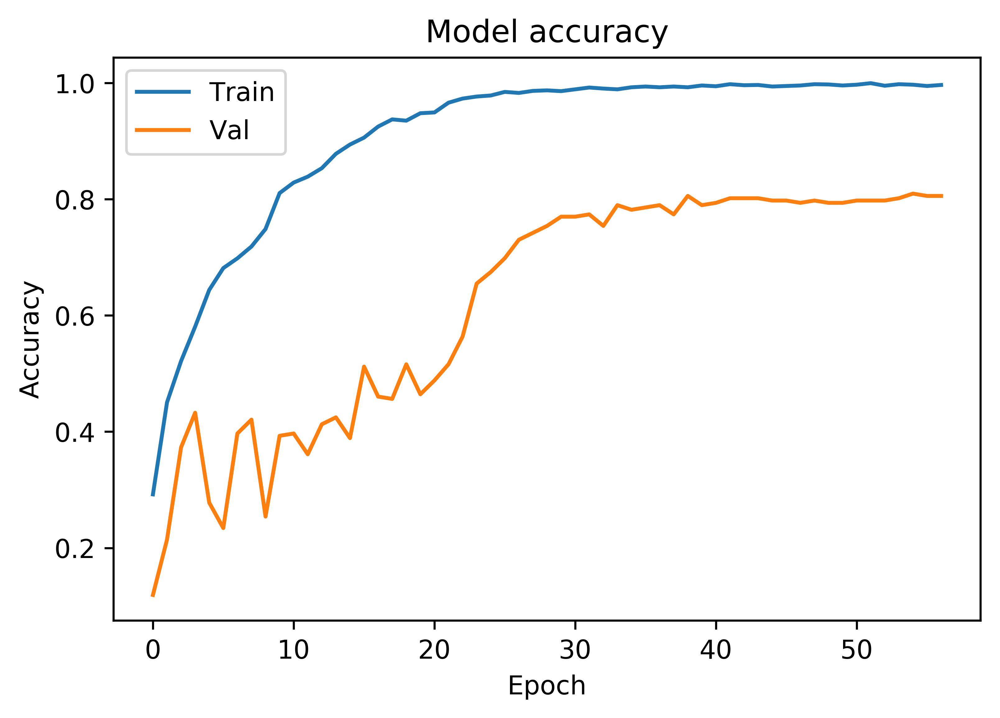

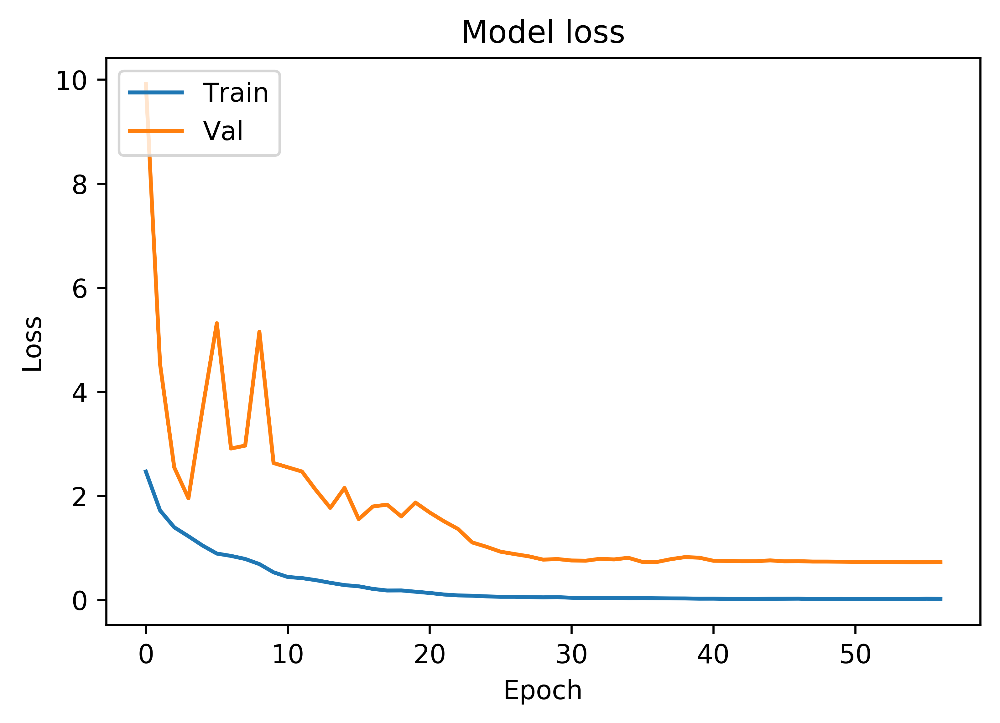

In [21]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [22]:
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True, class_names=class_names)

629/629 [==============================] - 1s 2ms/step
[0.5856363197199301, 0.8505564390760157]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         59    1        4     2          0         2     2          2
gel          1   81        3     2          2         0     2          1
network      0    0       52     2          0         4     2          5
plot         3    0        4    70          0         0     9          0
histology    0    0        0     1         75         0     0          0
sequence     1    2        5     0          1        63     1          1
line         1    0        3     8          0         5    69          0
molecular    0    0        5     1          2         0     4         66
              precision    recall  f1-score   support

         bar       0.91      0.82      0.86        72
         gel       0.96      0.88      0.92        92
     network       0.68      0.80      0.74        65
        plot       0.81      0

### Inspect misclassifications

blue = ground truth, red = prediction


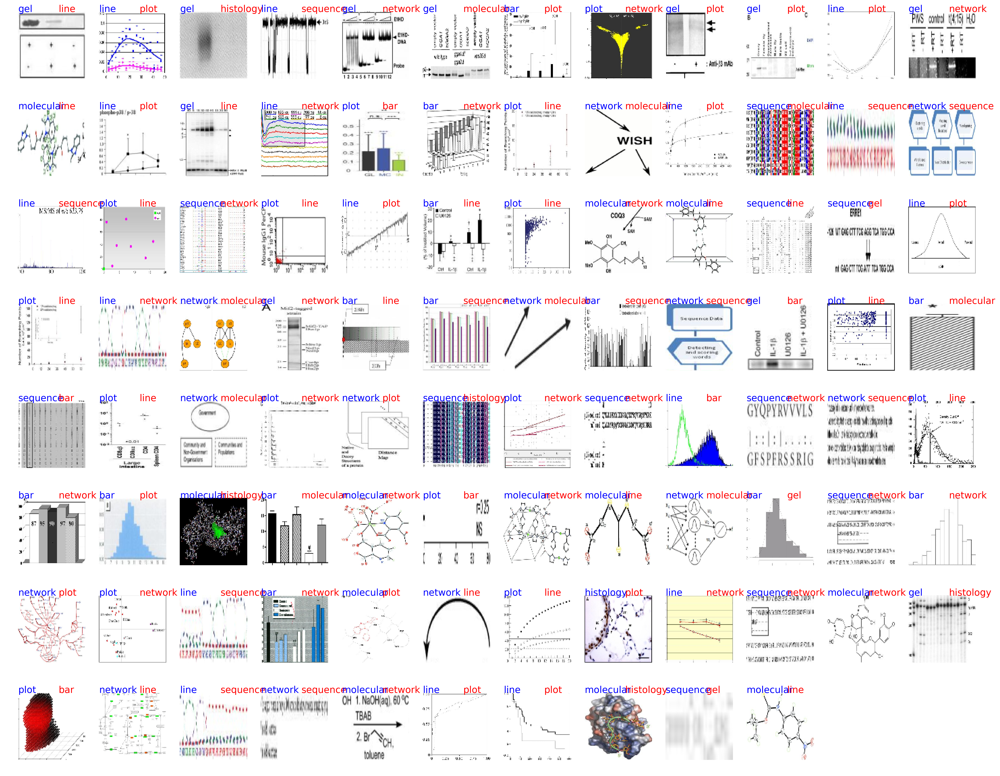

In [23]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### Load and test using best val_acc weights

In [24]:
text_image_model.layers[-2].load_weights(filepath)#as per the multigpu checkpoint
#text_image_model.load_weights(filepath)
print('Test on Image + text')
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test))

Test on Image + text
629/629 [==============================] - 1s 2ms/step
[0.584389858007052, 0.8505564390760157]
    0   1   2   3   4   5   6   7
0  59   1   4   2   0   2   2   2
1   1  81   3   2   2   0   2   1
2   0   0  52   2   0   4   2   5
3   3   0   3  70   0   0  10   0
4   0   0   0   1  75   0   0   0
5   1   2   5   0   1  63   1   1
6   1   0   3   8   0   5  69   0
7   0   0   5   1   2   0   4  66
              precision    recall  f1-score   support

           0       0.91      0.82      0.86        72
           1       0.96      0.88      0.92        92
           2       0.69      0.80      0.74        65
           3       0.81      0.81      0.81        86
           4       0.94      0.99      0.96        76
           5       0.85      0.85      0.85        74
           6       0.77      0.80      0.78        86
           7       0.88      0.85      0.86        78

   micro avg       0.85      0.85      0.85       629
   macro avg       0.85      0.85   

### Inspect misclassifications

blue = ground truth, red = prediction


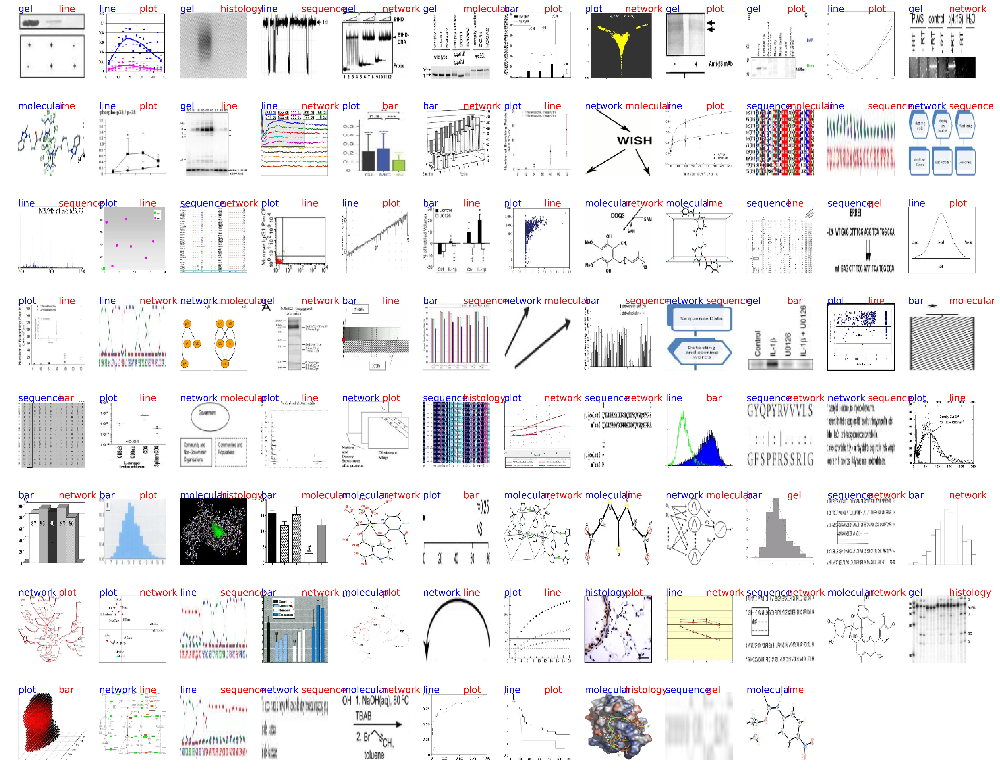

In [25]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

# Section 3: K-Fold Validation

### Get data into format our model understands

In [26]:
#Get all data to kfoldsplit
X_text, X_image, y, tokenizer = get_model_data(data, seed=seed, test_size = test_size, 
                vocabulary_size = vocabulary_size, filters = filters, 
                max_text_len=max_text_len, shape=shape, split=True)
X_text = np.array(X_text)#need to fix this!!!!!!!!!!!!!!!!!!!!!!!!!!!

filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/ysm-gpfs/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


### Load our word embeddings

In [27]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

### K fold validation on images only

In [28]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    image_model = Generate_Model(image = True, text=False)
    
    image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="early_fusion_weights/best_weight_image_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = image_model.fit([X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="early_fusion_weights/final_weight_image_only_k-fold_{}.hdf5".format(count)
    image_model.save_weights(filepath)
    scores = image_model.evaluate([X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(image_model, zip(X_image[test], y[test]), image = True, text = False, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 8s 3ms/step - loss: 2.6381 - acc: 0.2628 - val_loss: 3.9166 - val_acc: 0.2738

Epoch 00001: val_acc improved from -inf to 0.27381, saving model to early_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 2.1491 - acc: 0.3544 - val_loss: 3.1731 - val_acc: 0.3730

Epoch 00002: val_acc improved from 0.27381 to 0.37302, saving model to early_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.6613 - acc: 0.4442 - val_loss: 2.3366 - val_acc: 0.4008

Epoch 00003: val_acc improved from 0.37302 to 0.40079, saving model to early_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.4839 - acc: 0.4885 - val_loss: 2.1855 - v


Epoch 00037: val_acc improved from 0.78968 to 0.80159, saving model to early_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 38/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0129 - acc: 0.9965 - val_loss: 0.8217 - val_acc: 0.7817

Epoch 00038: val_acc did not improve from 0.80159
Epoch 39/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0127 - acc: 0.9960 - val_loss: 0.8326 - val_acc: 0.7817

Epoch 00039: val_acc did not improve from 0.80159
Epoch 40/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0159 - acc: 0.9938 - val_loss: 0.7407 - val_acc: 0.7897

Epoch 00040: val_acc did not improve from 0.80159
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0074 - acc: 0.9991 - val_loss: 0.7374 - val_acc: 0.7937

Epoch 00041: val_acc did not improve from 0.80159
Epoch 42/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0103 - acc: 0.9969 - val_loss: 0.7603 - va

2260/2260 [==============================] - 2s 1ms/step - loss: 1.4888 - acc: 0.4721 - val_loss: 1.6995 - val_acc: 0.4127

Epoch 00004: val_acc improved from 0.39683 to 0.41270, saving model to early_fusion_weights/best_weight_image_only_k-fold_2.hdf5
Epoch 5/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.3088 - acc: 0.5465 - val_loss: 1.5857 - val_acc: 0.4802

Epoch 00005: val_acc improved from 0.41270 to 0.48016, saving model to early_fusion_weights/best_weight_image_only_k-fold_2.hdf5
Epoch 6/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.1586 - acc: 0.6146 - val_loss: 1.5298 - val_acc: 0.4921

Epoch 00006: val_acc improved from 0.48016 to 0.49206, saving model to early_fusion_weights/best_weight_image_only_k-fold_2.hdf5
Epoch 7/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.9480 - acc: 0.6650 - val_loss: 2.5590 - val_acc: 0.4048

Epoch 00007: val_acc did not improve from 0.49206
Epoch 8/150
2260/2260 [========

2260/2260 [==============================] - 2s 1ms/step - loss: 0.0137 - acc: 0.9973 - val_loss: 0.6406 - val_acc: 0.8492

Epoch 00039: val_acc improved from 0.84524 to 0.84921, saving model to early_fusion_weights/best_weight_image_only_k-fold_2.hdf5
Epoch 40/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0123 - acc: 0.9982 - val_loss: 0.6340 - val_acc: 0.8492

Epoch 00040: val_acc did not improve from 0.84921
Epoch 41/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0147 - acc: 0.9960 - val_loss: 0.6291 - val_acc: 0.8492

Epoch 00041: val_acc did not improve from 0.84921
Epoch 42/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0165 - acc: 0.9956 - val_loss: 0.6309 - val_acc: 0.8452

Epoch 00042: val_acc did not improve from 0.84921
Epoch 43/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0118 - acc: 0.9978 - val_loss: 0.6287 - val_acc: 0.8492

Epoch 00043: val_acc improved from 0.84921 to 0.8

2260/2260 [==============================] - 2s 1ms/step - loss: 0.0597 - acc: 0.9801 - val_loss: 1.1817 - val_acc: 0.6905

Epoch 00021: val_acc improved from 0.66270 to 0.69048, saving model to early_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 22/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0552 - acc: 0.9850 - val_loss: 0.9863 - val_acc: 0.7460

Epoch 00022: val_acc improved from 0.69048 to 0.74603, saving model to early_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 23/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0404 - acc: 0.9894 - val_loss: 0.9504 - val_acc: 0.7341

Epoch 00023: val_acc did not improve from 0.74603
Epoch 24/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0420 - acc: 0.9885 - val_loss: 0.9209 - val_acc: 0.7421

Epoch 00024: val_acc did not improve from 0.74603
Epoch 25/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0345 - acc: 0.9894 - val_lo


Epoch 00006: val_acc improved from 0.48016 to 0.51587, saving model to early_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 7/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.8927 - acc: 0.6953 - val_loss: 1.4148 - val_acc: 0.5238

Epoch 00007: val_acc improved from 0.51587 to 0.52381, saving model to early_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 8/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.7752 - acc: 0.7328 - val_loss: 1.6538 - val_acc: 0.4921

Epoch 00008: val_acc did not improve from 0.52381
Epoch 9/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.6511 - acc: 0.7650 - val_loss: 1.2831 - val_acc: 0.5833

Epoch 00009: val_acc improved from 0.52381 to 0.58333, saving model to early_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 10/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.6061 - acc: 0.7870 - val_loss: 1.3645 - val_acc: 0.5317

Epoch 00010: val_

2268/2268 [==============================] - 2s 1ms/step - loss: 0.0106 - acc: 0.9982 - val_loss: 0.6715 - val_acc: 0.8452

Epoch 00044: val_acc improved from 0.83730 to 0.84524, saving model to early_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 45/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0137 - acc: 0.9956 - val_loss: 0.6704 - val_acc: 0.8452

Epoch 00045: val_acc did not improve from 0.84524
Epoch 46/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0099 - acc: 0.9987 - val_loss: 0.6632 - val_acc: 0.8492

Epoch 00046: val_acc improved from 0.84524 to 0.84921, saving model to early_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Results from K-fold: 4
acc: 83.81%
624/624 [==============================] - 0s 650us/step
[0.6925998972012446, 0.8381410256410257]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         70    1        3     2          0         0     1          1
gel          1 

2268/2268 [==============================] - 2s 1ms/step - loss: 0.0414 - acc: 0.9881 - val_loss: 1.1443 - val_acc: 0.7341

Epoch 00025: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00025: val_acc did not improve from 0.78571
Epoch 26/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0404 - acc: 0.9912 - val_loss: 0.8452 - val_acc: 0.7857

Epoch 00026: val_acc improved from 0.78571 to 0.78571, saving model to early_fusion_weights/best_weight_image_only_k-fold_5.hdf5
Epoch 27/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0281 - acc: 0.9943 - val_loss: 0.8082 - val_acc: 0.8016

Epoch 00027: val_acc improved from 0.78571 to 0.80159, saving model to early_fusion_weights/best_weight_image_only_k-fold_5.hdf5
Epoch 28/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0235 - acc: 0.9929 - val_loss: 0.8105 - val_acc: 0.7976

Epoch 00028: val_acc did not improve from 0.80159
Epoch 29/150
2268/2268 [=

### Plot training history

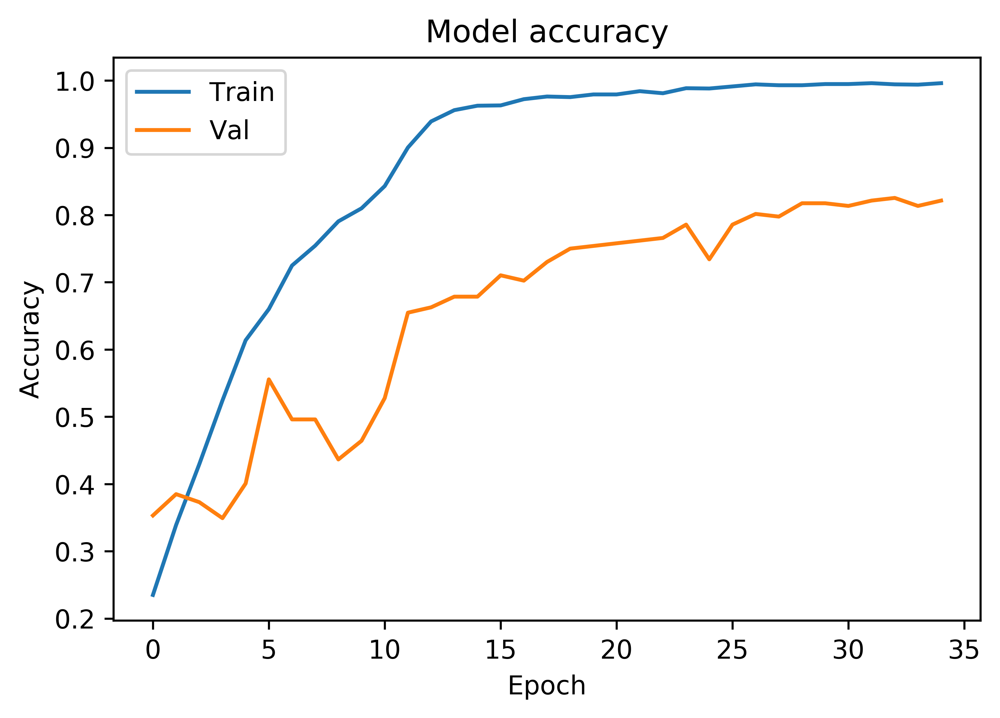

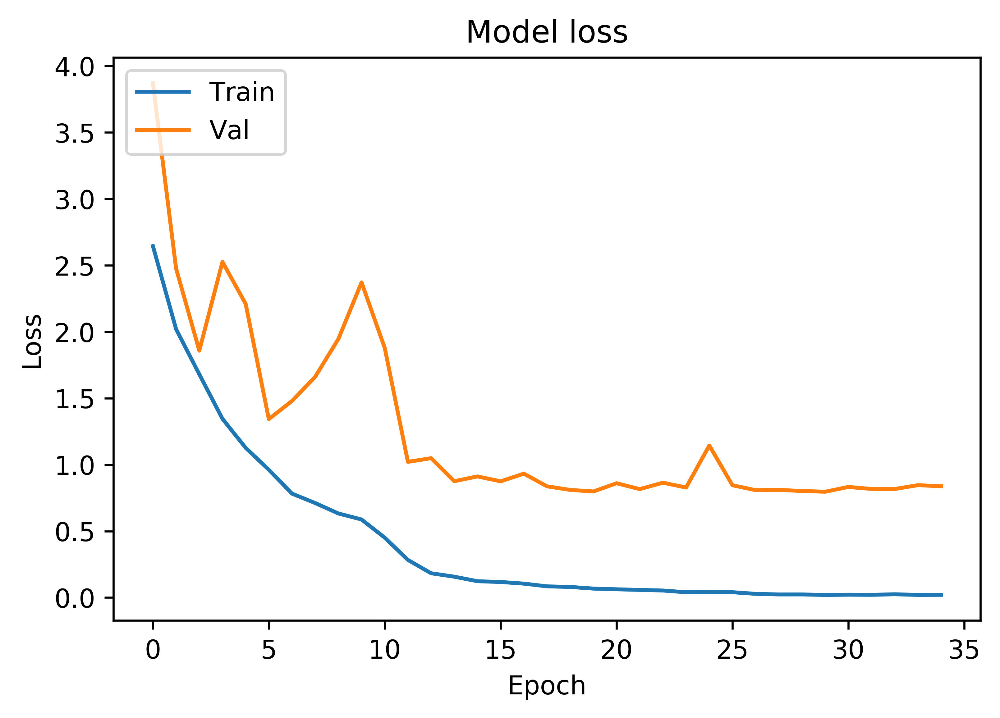

In [29]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### K fold validation on text only

In [30]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_model = Generate_Model(image = False, text=True)
    text_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="early_fusion_weights/best_weight_text_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_model.fit([X_text[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="early_fusion_weights/final_weight_text_only_k-fold_{}.hdf5".format(count)
    text_model.save_weights(filepath)
    scores = text_model.evaluate([X_text[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_model, zip(X_text[test], y[test]), image = False, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 13s 6ms/step - loss: 3.0930 - acc: 0.1544 - val_loss: 5.4269 - val_acc: 0.1944

Epoch 00001: val_acc improved from -inf to 0.19444, saving model to early_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 4s 2ms/step - loss: 2.7300 - acc: 0.1673 - val_loss: 5.6422 - val_acc: 0.1865

Epoch 00002: val_acc did not improve from 0.19444
Epoch 3/150
2260/2260 [==============================] - 5s 2ms/step - loss: 2.5643 - acc: 0.1942 - val_loss: 2.4773 - val_acc: 0.2262

Epoch 00003: val_acc improved from 0.19444 to 0.22619, saving model to early_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 5s 2ms/step - loss: 2.4324 - acc: 0.2031 - val_loss: 2.1789 - val_acc: 0.2500

Epoch 00004: val_acc improved from 0.22619 to 0.25000, saving mo


Epoch 00037: val_acc did not improve from 0.55952
Epoch 38/150
2260/2260 [==============================] - 5s 2ms/step - loss: 0.9610 - acc: 0.6460 - val_loss: 1.3799 - val_acc: 0.5635

Epoch 00038: val_acc improved from 0.55952 to 0.56349, saving model to early_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 39/150
2260/2260 [==============================] - 5s 2ms/step - loss: 0.9728 - acc: 0.6398 - val_loss: 1.3472 - val_acc: 0.5714

Epoch 00039: val_acc improved from 0.56349 to 0.57143, saving model to early_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 40/150
2260/2260 [==============================] - 4s 2ms/step - loss: 0.9580 - acc: 0.6420 - val_loss: 1.3147 - val_acc: 0.5754

Epoch 00040: val_acc improved from 0.57143 to 0.57540, saving model to early_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 41/150
2260/2260 [==============================] - 5s 2ms/step - loss: 0.9617 - acc: 0.6566 - val_loss: 1.3196 - val_acc: 0.5754

Epoch 00041: val_

2260/2260 [==============================] - 5s 2ms/step - loss: 0.9708 - acc: 0.6478 - val_loss: 3.7556 - val_acc: 0.1389

Epoch 00019: val_acc did not improve from 0.26984
Epoch 20/150
2260/2260 [==============================] - 5s 2ms/step - loss: 0.9712 - acc: 0.6288 - val_loss: 3.8799 - val_acc: 0.1349

Epoch 00020: val_acc did not improve from 0.26984
Epoch 21/150
2260/2260 [==============================] - 5s 2ms/step - loss: 0.9221 - acc: 0.6535 - val_loss: 3.5828 - val_acc: 0.1349

Epoch 00021: val_acc did not improve from 0.26984
Epoch 22/150
2260/2260 [==============================] - 5s 2ms/step - loss: 0.9322 - acc: 0.6438 - val_loss: 3.3671 - val_acc: 0.1587

Epoch 00022: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.

Epoch 00022: val_acc did not improve from 0.26984
Epoch 23/150
2260/2260 [==============================] - 4s 2ms/step - loss: 0.9000 - acc: 0.6646 - val_loss: 3.1960 - val_acc: 0.1627

Epoch 00023: val_acc did not improve from 0.269

2260/2260 [==============================] - 5s 2ms/step - loss: 1.7105 - acc: 0.3743 - val_loss: 3.7585 - val_acc: 0.1151

Epoch 00011: val_acc did not improve from 0.29365
Epoch 12/150
2260/2260 [==============================] - 4s 2ms/step - loss: 1.6425 - acc: 0.4013 - val_loss: 3.2027 - val_acc: 0.1151

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 00012: val_acc did not improve from 0.29365
Epoch 13/150
2260/2260 [==============================] - 4s 2ms/step - loss: 1.5345 - acc: 0.4535 - val_loss: 3.5269 - val_acc: 0.1230

Epoch 00013: val_acc did not improve from 0.29365
Epoch 14/150
2260/2260 [==============================] - 5s 2ms/step - loss: 1.3949 - acc: 0.4730 - val_loss: 3.5964 - val_acc: 0.1230

Epoch 00014: val_acc did not improve from 0.29365
Epoch 15/150
2260/2260 [==============================] - 4s 2ms/step - loss: 1.2420 - acc: 0.5336 - val_loss: 3.8854 - val_acc: 0.1230

Epoch 00015: val_acc did not improve from 0.29

2268/2268 [==============================] - 4s 2ms/step - loss: 2.1008 - acc: 0.2615 - val_loss: 2.6335 - val_acc: 0.2103

Epoch 00007: val_acc did not improve from 0.24603
Epoch 8/150
2268/2268 [==============================] - 5s 2ms/step - loss: 2.0060 - acc: 0.2663 - val_loss: 1.9948 - val_acc: 0.2381

Epoch 00008: val_acc did not improve from 0.24603
Epoch 9/150
2268/2268 [==============================] - 4s 2ms/step - loss: 1.8989 - acc: 0.3095 - val_loss: 2.9949 - val_acc: 0.2222

Epoch 00009: val_acc did not improve from 0.24603
Epoch 10/150
2268/2268 [==============================] - 5s 2ms/step - loss: 1.8262 - acc: 0.3263 - val_loss: 1.9715 - val_acc: 0.2738

Epoch 00010: val_acc improved from 0.24603 to 0.27381, saving model to early_fusion_weights/best_weight_text_only_k-fold_4.hdf5
Epoch 11/150
2268/2268 [==============================] - 5s 2ms/step - loss: 1.7531 - acc: 0.3435 - val_loss: 3.1558 - val_acc: 0.2262

Epoch 00011: val_acc did not improve from 0.27381
Ep

2268/2268 [==============================] - 5s 2ms/step - loss: 0.5022 - acc: 0.8192 - val_loss: 1.1327 - val_acc: 0.6706

Epoch 00044: val_acc did not improve from 0.67460
Epoch 45/150
2268/2268 [==============================] - 4s 2ms/step - loss: 0.5157 - acc: 0.7994 - val_loss: 1.1417 - val_acc: 0.6706

Epoch 00045: val_acc did not improve from 0.67460
Epoch 46/150
2268/2268 [==============================] - 5s 2ms/step - loss: 0.5268 - acc: 0.8069 - val_loss: 1.1192 - val_acc: 0.6746

Epoch 00046: val_acc did not improve from 0.67460
Epoch 47/150
2268/2268 [==============================] - 5s 2ms/step - loss: 0.5124 - acc: 0.8113 - val_loss: 1.1260 - val_acc: 0.6825

Epoch 00047: ReduceLROnPlateau reducing learning rate to 1.6000001778593287e-06.

Epoch 00047: val_acc improved from 0.67460 to 0.68254, saving model to early_fusion_weights/best_weight_text_only_k-fold_4.hdf5
Epoch 48/150
2268/2268 [==============================] - 5s 2ms/step - loss: 0.5016 - acc: 0.8139 - val_

2268/2268 [==============================] - 5s 2ms/step - loss: 1.7759 - acc: 0.3554 - val_loss: 2.4481 - val_acc: 0.1746

Epoch 00010: val_acc did not improve from 0.25000
Epoch 11/150
2268/2268 [==============================] - 5s 2ms/step - loss: 1.6961 - acc: 0.3695 - val_loss: 4.1414 - val_acc: 0.1468

Epoch 00011: val_acc did not improve from 0.25000
Epoch 12/150
2268/2268 [==============================] - 5s 2ms/step - loss: 1.5204 - acc: 0.4387 - val_loss: 2.7476 - val_acc: 0.2063

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 00012: val_acc did not improve from 0.25000
Epoch 13/150
2268/2268 [==============================] - 5s 2ms/step - loss: 1.3171 - acc: 0.5119 - val_loss: 3.2408 - val_acc: 0.1667

Epoch 00013: val_acc did not improve from 0.25000
Epoch 14/150
2268/2268 [==============================] - 4s 2ms/step - loss: 1.2004 - acc: 0.5516 - val_loss: 4.1058 - val_acc: 0.1508

Epoch 00014: val_acc did not improve from 0.25

2268/2268 [==============================] - 5s 2ms/step - loss: 0.6342 - acc: 0.7685 - val_loss: 1.1378 - val_acc: 0.6230

Epoch 00048: val_acc did not improve from 0.63095
Epoch 49/150
2268/2268 [==============================] - 5s 2ms/step - loss: 0.6236 - acc: 0.7738 - val_loss: 1.1384 - val_acc: 0.6310

Epoch 00049: val_acc improved from 0.63095 to 0.63095, saving model to early_fusion_weights/best_weight_text_only_k-fold_5.hdf5
Epoch 50/150
2268/2268 [==============================] - 5s 2ms/step - loss: 0.6210 - acc: 0.7668 - val_loss: 1.1279 - val_acc: 0.6389

Epoch 00050: val_acc improved from 0.63095 to 0.63889, saving model to early_fusion_weights/best_weight_text_only_k-fold_5.hdf5
Epoch 51/150
2268/2268 [==============================] - 4s 2ms/step - loss: 0.6344 - acc: 0.7646 - val_loss: 1.1223 - val_acc: 0.6389

Epoch 00051: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 00051: val_acc did not improve from 0.63889
Epoch 52/150
2268/2268 [====================

### Plot training history

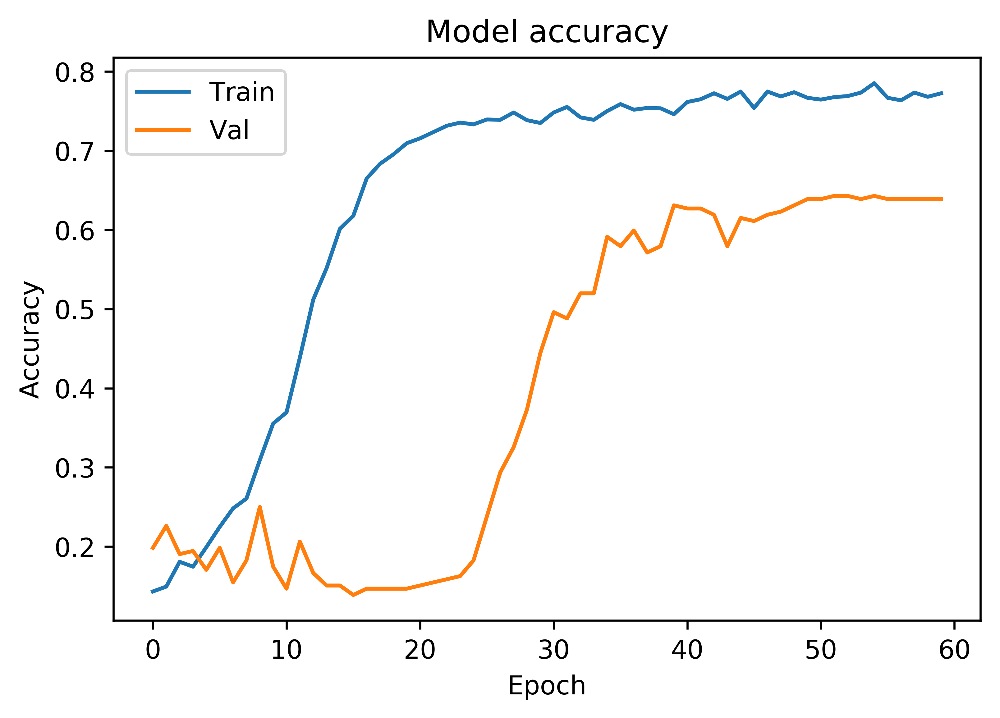

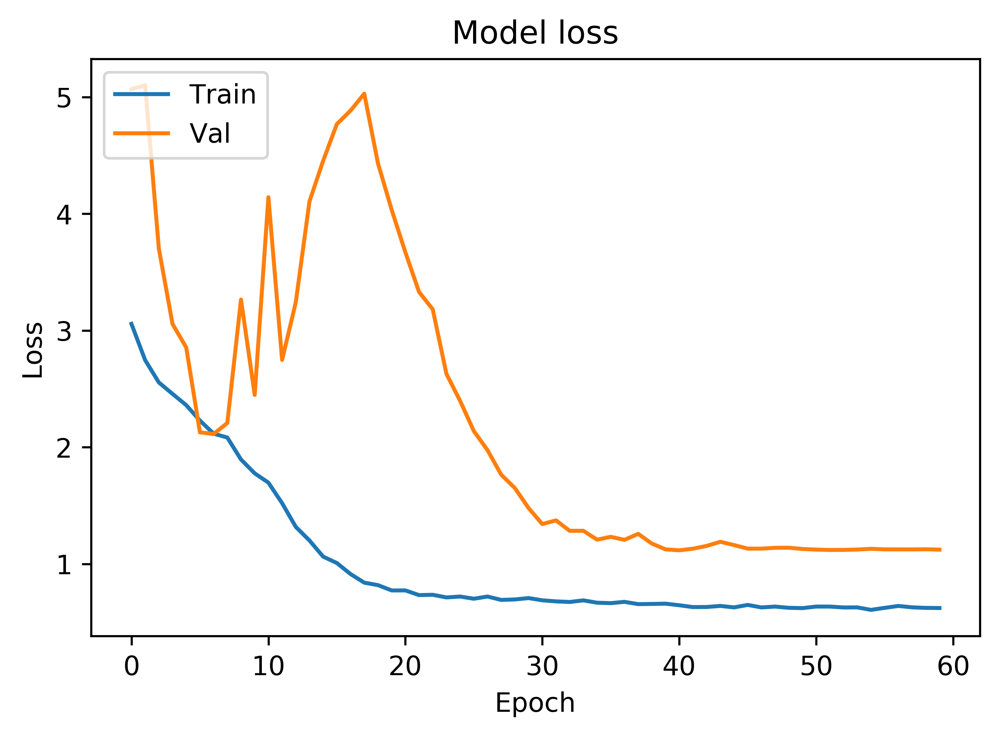

In [31]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### K-Fold validation Multimodal: text and images

In [32]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_image_model = Generate_Model(image = True, text=True)
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="early_fusion_weights/best_weight_image_text_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="early_fusion_weights/final_weight_image_text_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[test], X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[test], X_image[test], y[test]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
    
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 20s 9ms/step - loss: 2.4892 - acc: 0.2907 - val_loss: 7.3038 - val_acc: 0.2500

Epoch 00001: val_acc improved from -inf to 0.25000, saving model to early_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 7s 3ms/step - loss: 1.7466 - acc: 0.4504 - val_loss: 4.4489 - val_acc: 0.2778

Epoch 00002: val_acc improved from 0.25000 to 0.27778, saving model to early_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 7s 3ms/step - loss: 1.3908 - acc: 0.5447 - val_loss: 4.6060 - val_acc: 0.3452

Epoch 00003: val_acc improved from 0.27778 to 0.34524, saving model to early_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 8s 3ms/step - loss: 1.1910 - acc: 0.5965 - val_loss: 3.0582 - 

2260/2260 [==============================] - 8s 3ms/step - loss: 0.0495 - acc: 0.9867 - val_loss: 0.7465 - val_acc: 0.7778

Epoch 00037: val_acc did not improve from 0.78968
Epoch 38/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.0482 - acc: 0.9876 - val_loss: 0.7548 - val_acc: 0.7897

Epoch 00038: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.

Epoch 00038: val_acc did not improve from 0.78968
Epoch 39/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.0418 - acc: 0.9898 - val_loss: 0.7367 - val_acc: 0.7857

Epoch 00039: val_acc did not improve from 0.78968
Epoch 40/150
2260/2260 [==============================] - 7s 3ms/step - loss: 0.0432 - acc: 0.9894 - val_loss: 0.7294 - val_acc: 0.7857

Epoch 00040: val_acc did not improve from 0.78968
Epoch 41/150
2260/2260 [==============================] - 7s 3ms/step - loss: 0.0486 - acc: 0.9863 - val_loss: 0.7284 - val_acc: 0.7857

Epoch 00041: val_acc did not improve from 0.789

2260/2260 [==============================] - 7s 3ms/step - loss: 0.2175 - acc: 0.9221 - val_loss: 1.6916 - val_acc: 0.5437

Epoch 00016: val_acc improved from 0.52381 to 0.54365, saving model to early_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 17/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.2008 - acc: 0.9283 - val_loss: 1.4941 - val_acc: 0.5952

Epoch 00017: val_acc improved from 0.54365 to 0.59524, saving model to early_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 18/150
2260/2260 [==============================] - 7s 3ms/step - loss: 0.1953 - acc: 0.9301 - val_loss: 1.2890 - val_acc: 0.6190

Epoch 00018: val_acc improved from 0.59524 to 0.61905, saving model to early_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 19/150
2260/2260 [==============================] - 7s 3ms/step - loss: 0.1983 - acc: 0.9310 - val_loss: 1.1382 - val_acc: 0.6548

Epoch 00019: val_acc improved from 0.61905 to 0.65476, saving model to early_f

2260/2260 [==============================] - 7s 3ms/step - loss: 0.0225 - acc: 0.9960 - val_loss: 0.7128 - val_acc: 0.8452

Epoch 00052: val_acc did not improve from 0.84921
Epoch 53/150
2260/2260 [==============================] - 7s 3ms/step - loss: 0.0219 - acc: 0.9938 - val_loss: 0.6857 - val_acc: 0.8611

Epoch 00053: val_acc improved from 0.84921 to 0.86111, saving model to early_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 54/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.0210 - acc: 0.9956 - val_loss: 0.6640 - val_acc: 0.8571

Epoch 00054: val_acc did not improve from 0.86111
Epoch 55/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.0168 - acc: 0.9978 - val_loss: 0.6720 - val_acc: 0.8532

Epoch 00055: val_acc did not improve from 0.86111
Epoch 56/150
2260/2260 [==============================] - 7s 3ms/step - loss: 0.0200 - acc: 0.9973 - val_loss: 0.6761 - val_acc: 0.8532

Epoch 00056: ReduceLROnPlateau reducing learning 

2260/2260 [==============================] - 8s 3ms/step - loss: 0.1882 - acc: 0.9354 - val_loss: 2.6675 - val_acc: 0.4246

Epoch 00015: val_acc did not improve from 0.51587
Epoch 16/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.1514 - acc: 0.9469 - val_loss: 2.7025 - val_acc: 0.3770

Epoch 00016: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00016: val_acc did not improve from 0.51587
Epoch 17/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.1318 - acc: 0.9553 - val_loss: 2.1211 - val_acc: 0.4643

Epoch 00017: val_acc did not improve from 0.51587
Epoch 18/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.1046 - acc: 0.9677 - val_loss: 1.6540 - val_acc: 0.5397

Epoch 00018: val_acc improved from 0.51587 to 0.53968, saving model to early_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 19/150
2260/2260 [==============================] - 8s 3ms/step - loss: 0.1005 - acc: 0.9673 - val

[INFO] training with 2 GPUs...
Train on 2268 samples, validate on 252 samples
Epoch 1/150
2268/2268 [==============================] - 22s 10ms/step - loss: 2.5598 - acc: 0.2910 - val_loss: 7.4613 - val_acc: 0.2460

Epoch 00001: val_acc improved from -inf to 0.24603, saving model to early_fusion_weights/best_weight_image_text_k-fold_4.hdf5
Epoch 2/150
2268/2268 [==============================] - 8s 3ms/step - loss: 1.8884 - acc: 0.4286 - val_loss: 6.9368 - val_acc: 0.2421

Epoch 00002: val_acc did not improve from 0.24603
Epoch 3/150
2268/2268 [==============================] - 8s 4ms/step - loss: 1.5270 - acc: 0.4974 - val_loss: 3.8847 - val_acc: 0.3373

Epoch 00003: val_acc improved from 0.24603 to 0.33730, saving model to early_fusion_weights/best_weight_image_text_k-fold_4.hdf5
Epoch 4/150
2268/2268 [==============================] - 8s 3ms/step - loss: 1.2492 - acc: 0.5728 - val_loss: 5.2419 - val_acc: 0.2500

Epoch 00004: val_acc did not improve from 0.33730
Epoch 5/150
2268/2268

2268/2268 [==============================] - 8s 3ms/step - loss: 0.0148 - acc: 0.9960 - val_loss: 0.8553 - val_acc: 0.7817

Epoch 00037: val_acc improved from 0.77778 to 0.78175, saving model to early_fusion_weights/best_weight_image_text_k-fold_4.hdf5
Epoch 38/150
2268/2268 [==============================] - 8s 3ms/step - loss: 0.0114 - acc: 0.9987 - val_loss: 0.7916 - val_acc: 0.8095

Epoch 00038: val_acc improved from 0.78175 to 0.80952, saving model to early_fusion_weights/best_weight_image_text_k-fold_4.hdf5
Epoch 39/150
2268/2268 [==============================] - 7s 3ms/step - loss: 0.0115 - acc: 0.9987 - val_loss: 0.7756 - val_acc: 0.8135

Epoch 00039: val_acc improved from 0.80952 to 0.81349, saving model to early_fusion_weights/best_weight_image_text_k-fold_4.hdf5
Epoch 40/150
2268/2268 [==============================] - 7s 3ms/step - loss: 0.0080 - acc: 0.9996 - val_loss: 0.7720 - val_acc: 0.8135

Epoch 00040: val_acc improved from 0.81349 to 0.81349, saving model to early_f

2268/2268 [==============================] - 8s 3ms/step - loss: 0.5834 - acc: 0.7809 - val_loss: 6.2602 - val_acc: 0.2738

Epoch 00010: val_acc did not improve from 0.44048
Epoch 11/150
2268/2268 [==============================] - 7s 3ms/step - loss: 0.4819 - acc: 0.8263 - val_loss: 2.1467 - val_acc: 0.4802

Epoch 00011: val_acc improved from 0.44048 to 0.48016, saving model to early_fusion_weights/best_weight_image_text_k-fold_5.hdf5
Epoch 12/150
2268/2268 [==============================] - 7s 3ms/step - loss: 0.4267 - acc: 0.8364 - val_loss: 4.2336 - val_acc: 0.2341

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.

Epoch 00012: val_acc did not improve from 0.48016
Epoch 13/150
2268/2268 [==============================] - 8s 3ms/step - loss: 0.3219 - acc: 0.8858 - val_loss: 5.5720 - val_acc: 0.2341

Epoch 00013: val_acc did not improve from 0.48016
Epoch 14/150
2268/2268 [==============================] - 8s 3ms/step - loss: 0.2452 - acc: 0.9123 - val

2268/2268 [==============================] - 7s 3ms/step - loss: 0.0253 - acc: 0.9938 - val_loss: 0.5160 - val_acc: 0.8413

Epoch 00046: val_acc did not improve from 0.84921
Epoch 47/150
2268/2268 [==============================] - 8s 3ms/step - loss: 0.0279 - acc: 0.9956 - val_loss: 0.5057 - val_acc: 0.8413

Epoch 00047: ReduceLROnPlateau reducing learning rate to 1.6000001778593287e-06.

Epoch 00047: val_acc did not improve from 0.84921
Epoch 48/150
2268/2268 [==============================] - 8s 3ms/step - loss: 0.0299 - acc: 0.9916 - val_loss: 0.5046 - val_acc: 0.8452

Epoch 00048: val_acc did not improve from 0.84921
Epoch 49/150
2268/2268 [==============================] - 8s 4ms/step - loss: 0.0210 - acc: 0.9956 - val_loss: 0.5074 - val_acc: 0.8413

Epoch 00049: val_acc did not improve from 0.84921
Epoch 50/150
2268/2268 [==============================] - 8s 3ms/step - loss: 0.0253 - acc: 0.9938 - val_loss: 0.5082 - val_acc: 0.8452

Epoch 00050: val_acc did not improve from 0.84

### Plot training history

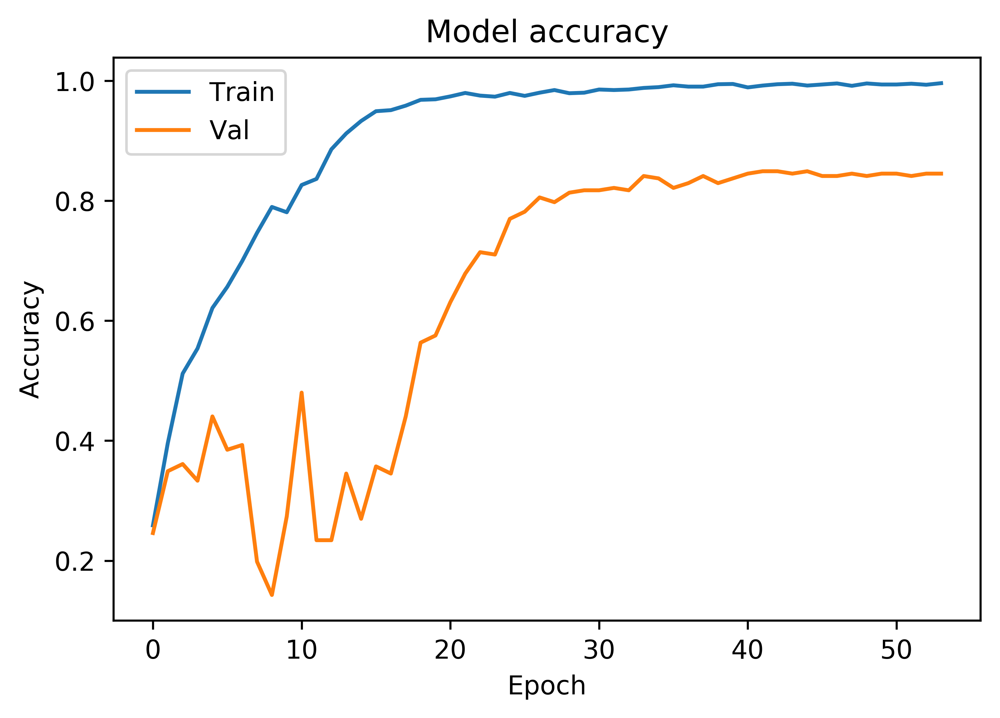

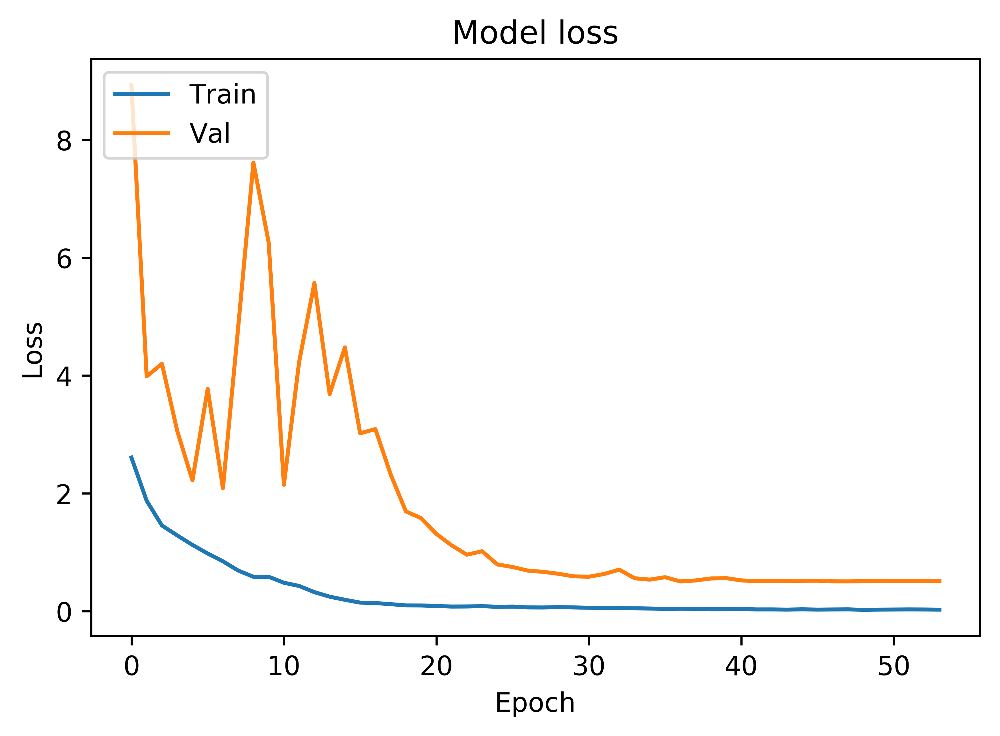

In [33]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### View images

blue = ground truth, red = prediction


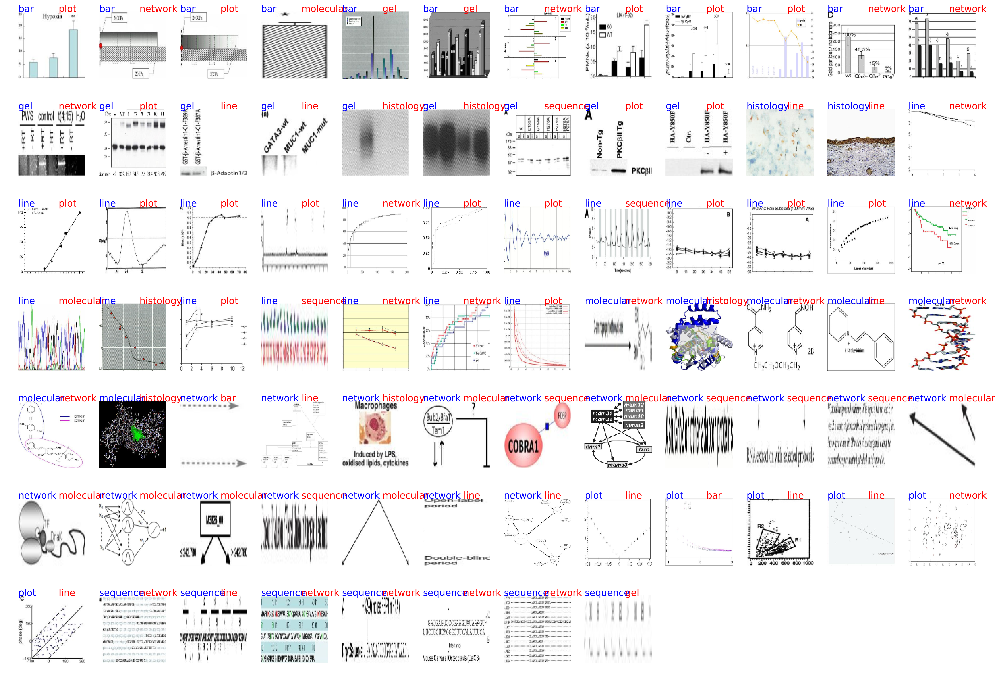

In [34]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[test] ]
test_wrong = [im for im in zip(X_image[test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

In [35]:
from keras import backend as K
K.clear_session()

In [36]:
def get_model_memory_usage(batch_size, model):
    import numpy as np
    from keras import backend as K

    shapes_mem_count = 0
    for l in model.layers:
        single_layer_mem = 1
        for s in l.output_shape:
            if s is None:
                continue
            single_layer_mem *= s
        shapes_mem_count += single_layer_mem

    trainable_count = np.sum([K.count_params(p) for p in set(model.trainable_weights)])
    non_trainable_count = np.sum([K.count_params(p) for p in set(model.non_trainable_weights)])

    total_memory = 4.0*batch_size*(shapes_mem_count + trainable_count + non_trainable_count)
    gbytes = np.round(total_memory / (1024.0 ** 3), 3)
    return gbytes

get_model_memory_usage(128, model)


NameError: name 'model' is not defined

In [ ]:
%whos

In [ ]:
#del text_model_vis
#del image_model_vis
#del text_image_model_vis
#del text_model
#del image_model
#del text_image_model

In [ ]:
import gc
gc.collect()

In [ ]:
def get_multi_gpu_model(model):
    # check to see if we are compiling using just a single GPU
    if G <= 1:
        print("[INFO] training with 1 GPU...")
        model = Model(inputs=model.inputs, outputs=model.outputs)
    # otherwise, we are compiling using multiple GPUs
    else:
        print("[INFO] training with {} GPUs...".format(G))
        # we'll store a copy of the model on *every* GPU and then combine
        # the results from the gradient updates on the CPU
        with tf.device("/cpu:0"):
            # initialize the model
            model = Model(inputs=model.inputs, outputs=model.outputs)
        # make the model parallel
        model = multi_gpu_model(model, gpus=G)
    return model

In [ ]:
t = get_multi_gpu_model(text_image_model)

In [ ]:
t.summary()